In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score, confusion_matrix

In [2]:
league_df = pd.read_csv('MatchTimelinesFirst15.csv')
league_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48651 entries, 0 to 48650
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               48651 non-null  int64  
 1   matchId                  48651 non-null  float64
 2   blue_win                 48651 non-null  int64  
 3   blueGold                 48651 non-null  float64
 4   blueMinionsKilled        48651 non-null  float64
 5   blueJungleMinionsKilled  48651 non-null  float64
 6   blueAvgLevel             48651 non-null  float64
 7   redGold                  48651 non-null  float64
 8   redMinionsKilled         48651 non-null  float64
 9   redJungleMinionsKilled   48651 non-null  float64
 10  redAvgLevel              48651 non-null  float64
 11  blueChampKills           48651 non-null  float64
 12  blueHeraldKills          48651 non-null  float64
 13  blueDragonKills          48651 non-null  float64
 14  blueTowersDestroyed   

In [7]:
league_df['blueGold_Diff'] = league_df['blueGold'] - league_df['redGold']

In [8]:
league_df.head()

,Unnamed: 0,matchId,blue_win,blueGold,blueMinionsKilled,blueJungleMinionsKilled,blueAvgLevel,redGold,redMinionsKilled,redJungleMinionsKilled,...,blueHeraldKills,blueDragonKills,blueTowersDestroyed,redChampKills,redHeraldKills,redDragonKills,redTowersDestroyed,Gold_Diff,Blue_Gold_Diff,blueGold_Diff
0,0,3.493251e+09,0,24575.0,349.0,89.0,8.6,25856.0,346.0,80.0,...,1.0,0.0,1.0,12.0,2.0,0.0,1.0,-1281.0,-1281.0,-1281.0
1,1,3.464936e+09,0,27210.0,290.0,36.0,9.0,28765.0,294.0,92.0,...,0.0,0.0,0.0,19.0,2.0,0.0,0.0,-1555.0,-1555.0,-1555.0
2,2,3.428426e+09,1,32048.0,346.0,92.0,9.4,25305.0,293.0,84.0,...,3.0,0.0,0.0,11.0,0.0,0.0,4.0,6743.0,6743.0,6743.0
3,3,3.428347e+09,0,20261.0,223.0,60.0,8.2,30429.0,356.0,107.0,...,0.0,0.0,3.0,16.0,3.0,0.0,0.0,-10168.0,-10168.0,-10168.0
4,4,3.428351e+09,1,30217.0,376.0,110.0,9.8,23889.0,334.0,60.0,...,3.0,0.0,0.0,8.0,0.0,0.0,2.0,6328.0,6328.0,6328.0


In [9]:
league_df = league_df.drop(columns=['Unnamed: 0', 'matchId']) # Dropping matchId since it's an identifier, not val

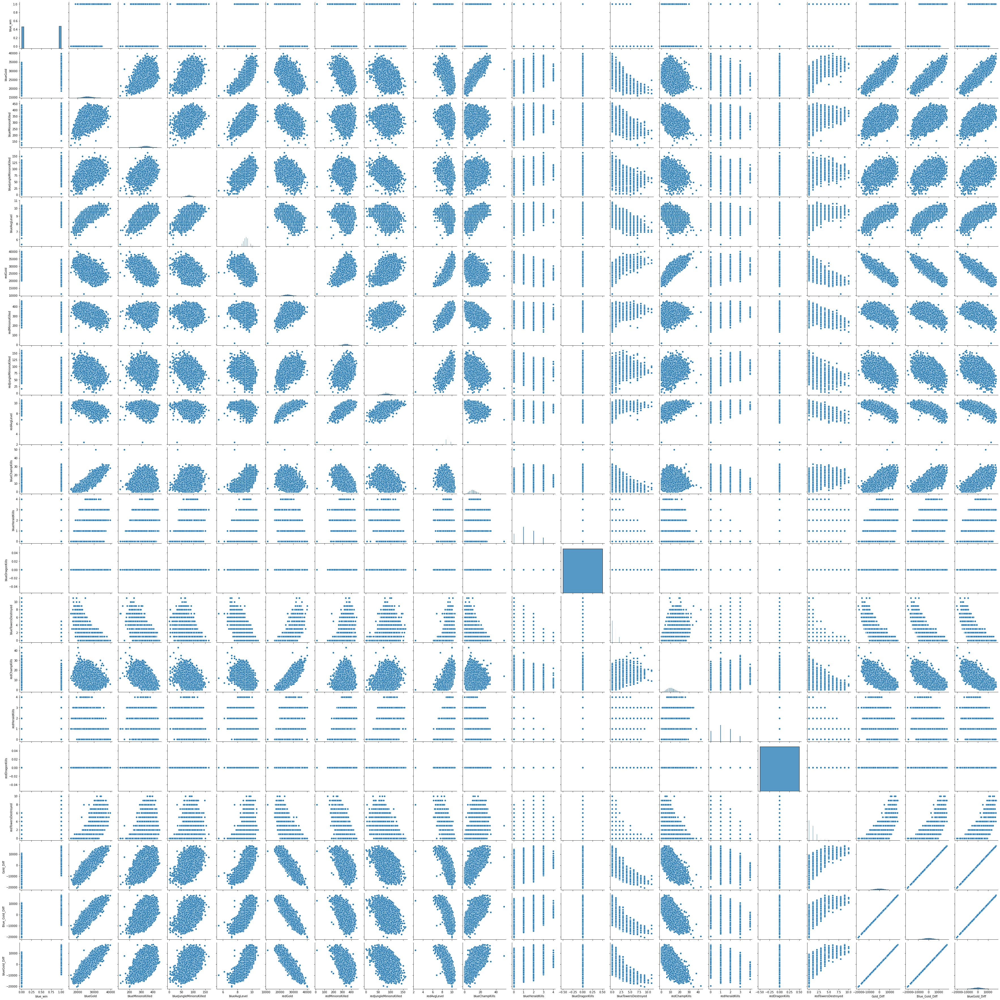

In [10]:
sns.pairplot(league_df)

In [11]:
league_df.redDragonKills.value_counts() # Weirdness in the pairplot on both dragon kills, seeing if there's anything
league_df.blueDragonKills.value_counts() # There's not, might as well drop them since it's not adding anything

0.0    48651
Name: blueDragonKills, dtype: int64

In [12]:
league_df = league_df.drop(columns = (['blueDragonKills', 'redDragonKills']))

In [13]:
league_df.head()

,blue_win,blueGold,blueMinionsKilled,blueJungleMinionsKilled,blueAvgLevel,redGold,redMinionsKilled,redJungleMinionsKilled,redAvgLevel,blueChampKills,blueHeraldKills,blueTowersDestroyed,redChampKills,redHeraldKills,redTowersDestroyed,Gold_Diff,Blue_Gold_Diff,blueGold_Diff
0,0,24575.0,349.0,89.0,8.6,25856.0,346.0,80.0,9.2,6.0,1.0,1.0,12.0,2.0,1.0,-1281.0,-1281.0,-1281.0
1,0,27210.0,290.0,36.0,9.0,28765.0,294.0,92.0,9.4,20.0,0.0,0.0,19.0,2.0,0.0,-1555.0,-1555.0,-1555.0
2,1,32048.0,346.0,92.0,9.4,25305.0,293.0,84.0,9.4,17.0,3.0,0.0,11.0,0.0,4.0,6743.0,6743.0,6743.0
3,0,20261.0,223.0,60.0,8.2,30429.0,356.0,107.0,9.4,7.0,0.0,3.0,16.0,3.0,0.0,-10168.0,-10168.0,-10168.0
4,1,30217.0,376.0,110.0,9.8,23889.0,334.0,60.0,8.8,16.0,3.0,0.0,8.0,0.0,2.0,6328.0,6328.0,6328.0


In [14]:
league_df['winner'] = league_df['blue_win'].apply(lambda x: 'Blue' if x == 1 else 'Red')

In [15]:
league_df.winner.value_counts()

Blue    24589
Red     24062
Name: winner, dtype: int64

In [16]:
league_df.head()

,blue_win,blueGold,blueMinionsKilled,blueJungleMinionsKilled,blueAvgLevel,redGold,redMinionsKilled,redJungleMinionsKilled,redAvgLevel,blueChampKills,blueHeraldKills,blueTowersDestroyed,redChampKills,redHeraldKills,redTowersDestroyed,Gold_Diff,Blue_Gold_Diff,blueGold_Diff,winner
0,0,24575.0,349.0,89.0,8.6,25856.0,346.0,80.0,9.2,6.0,1.0,1.0,12.0,2.0,1.0,-1281.0,-1281.0,-1281.0,Red
1,0,27210.0,290.0,36.0,9.0,28765.0,294.0,92.0,9.4,20.0,0.0,0.0,19.0,2.0,0.0,-1555.0,-1555.0,-1555.0,Red
2,1,32048.0,346.0,92.0,9.4,25305.0,293.0,84.0,9.4,17.0,3.0,0.0,11.0,0.0,4.0,6743.0,6743.0,6743.0,Blue
3,0,20261.0,223.0,60.0,8.2,30429.0,356.0,107.0,9.4,7.0,0.0,3.0,16.0,3.0,0.0,-10168.0,-10168.0,-10168.0,Red
4,1,30217.0,376.0,110.0,9.8,23889.0,334.0,60.0,8.8,16.0,3.0,0.0,8.0,0.0,2.0,6328.0,6328.0,6328.0,Blue


In [17]:
X_train, X_test, y_train, y_test = train_test_split(league_df.iloc[:, 1:], league_df.iloc[:, 0], 
                                                    test_size = 0.2, random_state=42)

train_df = X_train.copy()
train_df['blue_win'] = y_train
train_df.head()

,blueGold,blueMinionsKilled,blueJungleMinionsKilled,blueAvgLevel,redGold,redMinionsKilled,redJungleMinionsKilled,redAvgLevel,blueChampKills,blueHeraldKills,blueTowersDestroyed,redChampKills,redHeraldKills,redTowersDestroyed,Gold_Diff,Blue_Gold_Diff,blueGold_Diff,winner,blue_win
42325,25406.0,276.0,60.0,8.8,28670.0,341.0,96.0,9.6,15.0,1.0,2.0,14.0,2.0,0.0,-3264.0,-3264.0,-3264.0,Blue,1
40360,21942.0,297.0,52.0,8.4,30225.0,377.0,99.0,9.6,7.0,1.0,4.0,12.0,2.0,0.0,-8283.0,-8283.0,-8283.0,Red,0
12604,26454.0,324.0,81.0,9.0,27410.0,309.0,88.0,9.4,11.0,1.0,0.0,16.0,2.0,0.0,-956.0,-956.0,-956.0,Red,0
14763,24204.0,348.0,80.0,9.0,25954.0,337.0,86.0,9.6,8.0,1.0,0.0,10.0,1.0,0.0,-1750.0,-1750.0,-1750.0,Red,0
46358,25284.0,306.0,71.0,9.2,28949.0,388.0,95.0,9.2,14.0,0.0,2.0,11.0,2.0,0.0,-3665.0,-3665.0,-3665.0,Red,0


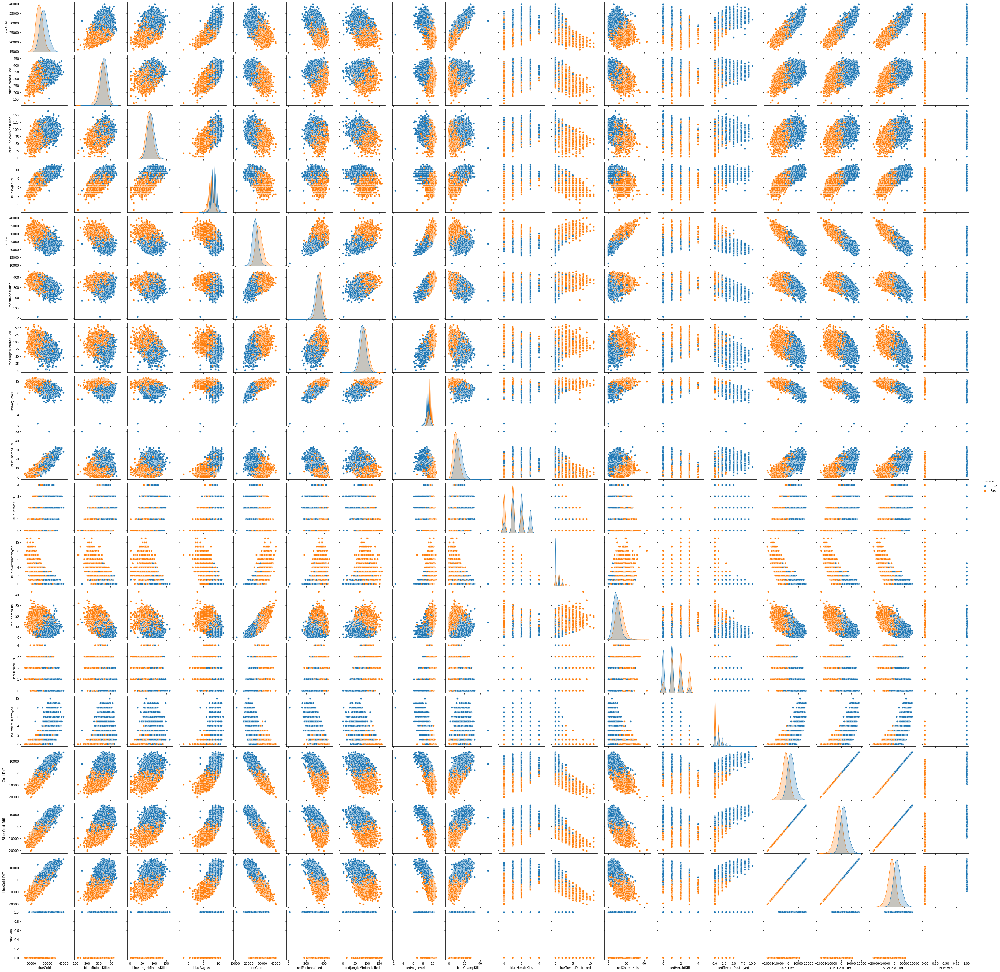

In [18]:
sns.pairplot(train_df, hue='winner')

In [20]:
small_xtrain, small_xtest, small_ytrain, small_ytest = train_test_split(league_df[['blueGold', 'blueMinionsKilled',
                                                                                   'blueChampKills', 'blueTowersDestroyed',
                                                                                   'blueGold_Diff']], league_df['blue_win'],
                                                                        test_size = .2, random_state=42)

We're gonna test on some blue team only features since they're our target and focusing on their improvement more. The score to hold against is precision as we want to be sure our model is properly predicting and that false negatives are not going to have as much weight in team selection

In [21]:
smaller_xtrain, smaller_xtest, smaller_ytrain, smaller_ytest = train_test_split(small_xtrain, small_ytrain,
                                                                                test_size=.25, random_state=42)

In [41]:
log_reg = LogisticRegression(C=100)
log_reg.fit(smaller_xtrain, smaller_ytrain)

LogisticRegression(C=100)

In [42]:
recall_score(smaller_ytrain, log_reg.predict(smaller_xtrain))

0.7819533487927977

In [43]:
recall_score(smaller_ytest, log_reg.predict(smaller_xtest))

0.7679222357229648

In [44]:
confusion_matrix(smaller_ytest, log_reg.predict(smaller_xtest))

array([[3706, 1086],
       [1146, 3792]])

In [45]:
log_reg.fit(small_xtrain, small_ytrain)

LogisticRegression(C=100)

In [46]:
precision_score(small_ytrain, log_reg.predict(small_xtrain))

0.7783434302295983

In [47]:
precision_score(small_ytest, log_reg.predict(small_xtest))

0.7923530608094367

In [51]:
blue_confuse = confusion_matrix(small_ytest, log_reg.predict(small_xtest))

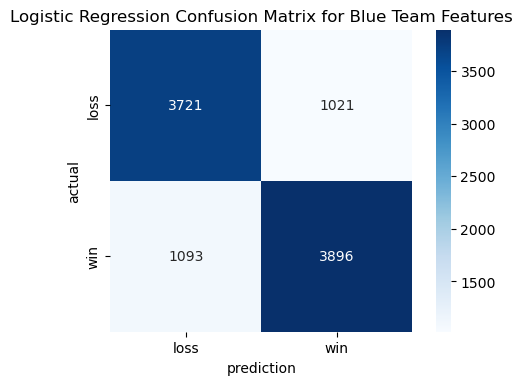

In [60]:
plt.figure(dpi=100);
sns.heatmap(blue_confuse, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['loss', 'win'],
           yticklabels=['loss', 'win']);
plt.xlabel('prediction');
plt.ylabel('actual');
plt.title('Logistic Regression Confusion Matrix for Blue Team Features')
plt.savefig('figures/Blue_team_confusion_matrix.svg', bbox_inches = 'tight')